## To estimate min height and width for Insight3 analysis 


In [14]:
import os
import numpy
import matplotlib.pyplot as plt
import pandas as pd

# Change directory
os.chdir("D:/new-storm-data/06-02-20_brain/daostorm-analysis")
file='movie_0005.csv'
resolution = 16 # Since we're using the 16 bit channel of the camera ADC

In [15]:
# Load molecule list into a dataframe
col_list = ['background', 'height', 'xsigma']
df = pd.read_csv(file, usecols=col_list)
print('Original : \n', df.head())

# Convert 'background' and 'height' columns from photoelectrons to counts
df['background'] = 36*df['background']
df['height'] = 36*df['height']

# Convert sigma to FWHM in nm 
df['xsigma'] = 2*160*df['xsigma']
print('Modified : \n', df.head())

Original : 
    background  height  xsigma
0       5.977  19.351   1.034
1      16.950  28.516   1.443
2       5.985  74.441   1.091
3       9.649  23.596   0.739
4       3.993  30.940   1.302
Modified : 
    background    height  xsigma
0     215.172   696.636  330.88
1     610.200  1026.576  461.76
2     215.460  2679.876  349.12
3     347.364   849.456  236.48
4     143.748  1113.840  416.64


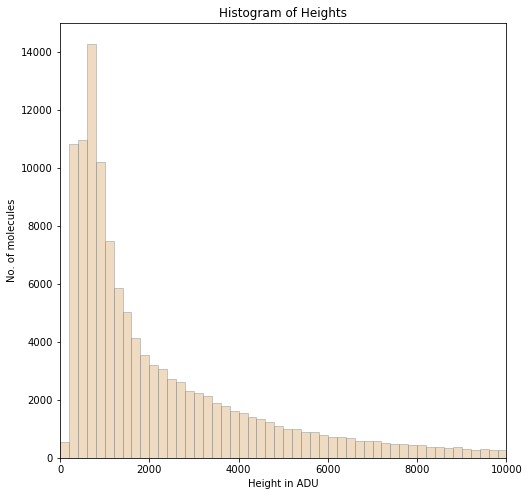

In [16]:
# Plot histogram of heights of localizations (in counts)

counts = 2**resolution
bins1 = numpy.arange(0, counts+1, 200)
plt.figure(figsize = (8,8))
d1 = plt.hist(df['height'], bins=bins1, alpha=0.5, density= False, edgecolor='grey', linewidth=0.8, color='burlywood')
plt.xlim([0, 10000])
plt.title('Histogram of Heights')
plt.ylabel('No. of molecules')
plt.xlabel('Height in ADU')
# plt.savefig('storm_0003_height_histogram')
plt.show()

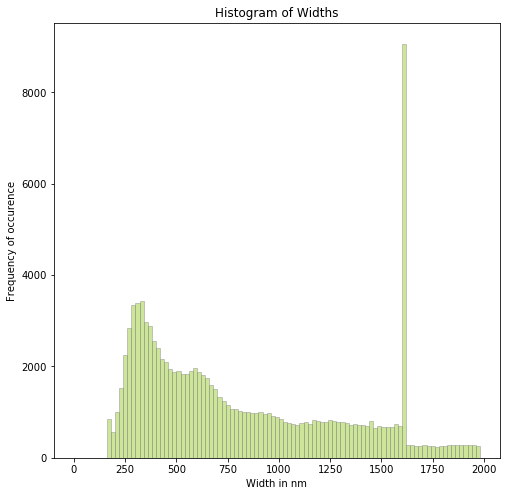

In [17]:
# Plot histogram of widths of localizations (in counts)

bins2 = numpy.arange(0, 2000, 20)
plt.figure(figsize = (8,8))
d2 = plt.hist(df['xsigma'], bins=bins2, alpha=0.5, density= False, edgecolor='grey', linewidth=0.8, color='yellowgreen')
# plt.xlim([100, 20000])
plt.title('Histogram of Widths')
plt.ylabel('Frequency of occurence')
plt.xlabel('Width in nm')
# plt.savefig('storm_0003_width_histogram')
plt.show()

In [18]:
print(df['height'].max())

542675.16


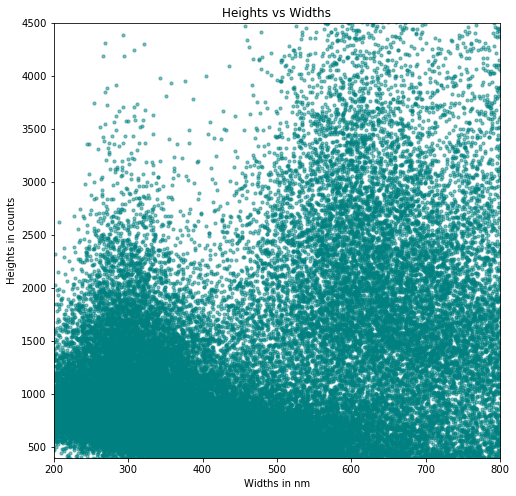

In [19]:
# Plot height vs width scatter plot

plt.figure(figsize = (8,8))
d3 = plt.scatter(df['xsigma'], df['height'], s=10, alpha=0.5, c='teal')
plt.xlim([200, 800])
plt.ylim([400, 4500])
plt.title('Heights vs Widths')
plt.ylabel('Heights in counts')
plt.xlabel('Widths in nm')
# plt.savefig('storm_0003_heights_vs_widths')
plt.show()

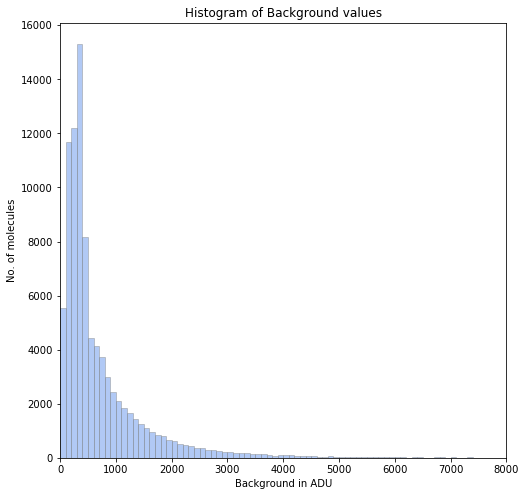

In [20]:
# Plot histogram of background values (in counts)

counts = 2**resolution
bins1 = numpy.arange(0, counts+1, 100)
plt.figure(figsize = (8,8))
d1 = plt.hist(df['background'], bins=bins1, alpha=0.5, density= False, edgecolor='grey', linewidth=0.8, color='cornflowerblue')
plt.xlim([0, 8000])
# plt.ylim([0, 100])
plt.title('Histogram of Background values')
plt.ylabel('No. of molecules')
plt.xlabel('Background in ADU')
plt.savefig('movie_0005_background_histogram')
plt.show()